In [1]:
import re
import os
import warnings
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.preprocessing import LabelEncoder
from matplotlib.patches import Rectangle, Circle, Polygon
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from glimmer.segment import abnormal_cell_detection, assign_cell_by_voronoi, merge_small_cells

warnings.filterwarnings('ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
%config InlineBackend.figure_format = 'retina'

In [10]:
# Set path
main_path = '/data/qiyu/spatialRegion/'
dir_path = main_path + "data/xenium/xenium_human_non_diseased_lymph_node/"
output_path = main_path + "benchmark/Public_data/Xenium_subsets/"
fig_path = main_path + 'figures/SVG/'
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'DejaVu Sans' 

In [3]:
# Subset patches from Xenium lymph node dataset
fov_ranges = [
    range(7,9), 
    range(9,11), 
    range(10,12), 
    range(13,15), 
    range(15,17), 
    range(17,19), 
    range(21,23), 
    range(23,25),  
    range(27,29), 
    range(29,31), 
    range(31,33), 
    range(33,35), 
    range(39,41), 
    range(41,43), 
    range(43,45)
]
fov_names = [f"{r.start}-{r.stop - 1}" for r in fov_ranges]

# Parameters
seed = 42
n_cluster_list = [5, 6, 7]
resolutions = [0.2, 0.3, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]
cluster_key_list = [f"cluster_{res:.2f}" for res in resolutions]
marker_genes = ['MS4A1', 'CD19', 'CD79A', 'TRAC', 'IL7R', 'CD3E']

## 2. Subset FOV (9-10) for visualization and detailed analysis

### 2.1 Heatmap for marker genes

In [4]:
# Select FOV for detailed analysis
fov_name = '9-10'
n_cluster = 5

# column info
x = "x_location"
y = "y_location"
nucleus_label = "nucleus_id"
bin_cluster = 'binned_cluster'
cell_cluster = 'cellular_cluster'
ficture_cluster = 'ficture_K1'
cellpose_cluster = 'cellpose_cluster'
bin_cluster_key = 'cluster_0.40'
cell_cluster_key = 'cluster_0.40'
cellpose_cluster_key = 'cluster_0.20'
baysor_cluster_key = 'cluster_k5'

# cluster names
ordered_clusters = [
    "B Cells", 
    "Plasma Cells",
    "T Cells", 
    "Macrophages", 
    "Endothelial Cells",
]
# marker genes
marker_genes_dict = {
    'B cells': ['MS4A1', 'CD19', 'CXCR4', 'IGHD'],
    'Plasma cells': ['CD79A', 'TNFRSF17', 'JCHAIN', 'MZB1'],
    'T cells': ['TRAC', 'IL7R', 'CD3E', 'CD3D', 'CD8A'],
    'Macrophages': ['CD163', 'AIF1', 'MPEG1', 'FGL2', 'CSF1R', 'MARCO'],
    'Endothelial cells': ['PECAM1', 'VWF', 'CAVIN1', 'CAVIN2'],
}

In [7]:
# plot heatmap
def plot_heatmap(adata, marker_genes_dict, save_fig=False, fig_name=None):
    marker_genes_dict = {
        cell_type: [gene for gene in genes if gene in adata.var_names]
        for cell_type, genes in marker_genes_dict.items()
    }
    sc.pl.matrixplot(adata, marker_genes_dict, groupby='cluster_name', cmap='Blues', 
                     standard_scale='var', swap_axes=False, show=False, title="")
    fig = plt.gcf().tight_layout()
    if save_fig:
        fig.savefig(fig_name, format="svg", bbox_inches="tight")
    plt.show()

# extract data for heatmap
def prepare_data(data, marker_genes_dict, cluster_key, cluster_mapping, ordered_clusters, standard_scale='var'):
    if isinstance(data, ad.AnnData):
        marker_genes_dict = {
            cell_type: [gene for gene in genes if gene in data.var_names]
            for cell_type, genes in marker_genes_dict.items()
        }
        valid_genes = [gene for genes in marker_genes_dict.values() for gene in genes]
        data.obs["cluster_name"] = pd.Categorical(
            data.obs[cluster_key].astype(str).replace(cluster_mapping),
            categories=ordered_clusters, ordered=True
        )
        exp_df = sc.get.obs_df(data, keys=valid_genes, layer=None)
        group_mean = exp_df.groupby(data.obs['cluster_name']).mean()
    else:
        valid_genes = [gene for genes in marker_genes_dict.values() for gene in genes]
        group_mean = data[[col for col in data.columns if col in valid_genes]].copy()

    if standard_scale == 'var':
        group_mean = group_mean.sub(group_mean.min(axis=0), axis=1)
        group_mean = group_mean.div(group_mean.max(axis=0), axis=1).fillna(0)
    elif standard_scale == 'group':
        group_mean = (group_mean - group_mean.min().min()) / \
                    (group_mean.max().max() - group_mean.min().min())
    return group_mean

In [ ]:
# 1. Load Glimmer data (Bin)
cluster_names = {
    "3": "B Cells", 
    "2": "T Cells", 
    "1": "Macrophages", 
    "0": "Plasma Cells",
    "4": "Endothelial Cells",
}
subset_adata = sc.read_h5ad(f"{output_path}{fov_name}/Glimmer/adata.h5ad")
data1 = prepare_data(subset_adata, marker_genes_dict, bin_cluster_key, cluster_names, 
                     ordered_clusters, standard_scale=['var', 'group'][0])

# 2. Load Baysor data
cluster_names = {
    "3": "B Cells", 
    "2": "T Cells", 
    "0": "Macrophages", 
    "4": "Plasma Cells",
    "1": "Endothelial Cells",
}
baysor_df = pd.read_csv(f"{output_path}{fov_name}/Baysor/baysor_segfree_adata.csv")
group_mean = (
    baysor_df
    .pivot_table(index='ncv_color', columns='gene', values='Count', aggfunc='sum', fill_value=0)
    .merge(baysor_df[[f"cluster_k{n_cluster}", 'ncv_color']].drop_duplicates(), left_index=True, right_on='ncv_color', how='left')
    .drop('ncv_color', axis=1)
    .groupby(f"cluster_k{n_cluster}")
    .mean()
)
group_mean.index = group_mean.index.astype(str).map(cluster_names)
data2 = prepare_data(group_mean, marker_genes_dict, baysor_cluster_key, cluster_names, 
                     ordered_clusters, standard_scale=['var', 'group'][0])
data2 = data2.reindex(index=data1.index, columns=data1.columns)

# 3. Load Cellpose data
cluster_names = {
    "1": "B Cells", 
    "0": "T Cells", 
    "2": "Macrophages", 
    "4": "Plasma Cells",
    "3": "Endothelial Cells",
}
subset_adata = sc.read_h5ad(f"{output_path}{fov_name}/Cellpose_cyto3_50/adata.h5ad")
data3 = prepare_data(subset_adata, marker_genes_dict, cellpose_cluster_key, cluster_names, 
                     ordered_clusters, standard_scale=['var', 'group'][0])
data3 = data3.reindex(index=data1.index, columns=data1.columns)

# 4. Load Xenium default segmentation
cluster_names = {
    "0": "B Cells", 
    "1": "T Cells", 
    "2": "Macrophages", 
    "3": "Plasma Cells",
    "4": "Endothelial Cells",
}
cluster_df = pd.read_csv(f"{output_path}{fov_name}/Xenium/cellular_leiden_clusters.csv", index_col=0)
adata_all = sc.read_h5ad(dir_path + "cell_level_adata_clustered_res1.5.h5ad")

adata = adata_all[adata_all.obs_names.isin(cluster_df.index), :].copy()
adata.obs[cell_cluster_key] = cluster_df[cell_cluster_key]
data4 = prepare_data(adata, marker_genes_dict, cell_cluster_key, cluster_names, 
                     ordered_clusters, standard_scale=['var', 'group'][0])
data4 = data4.reindex(index=data1.index, columns=data1.columns)

# 5. Load Ficture data
cluster_names = {
    "0": "B Cells", 
    "1": "T Cells", 
    "2": "Macrophages", 
    "4": "Plasma Cells",
    "3": "Endothelial Cells",
}
analysis_path = output_path + f"{fov_name}/Ficture/analysis/" 
folders = [f for f in os.listdir(analysis_path) if os.path.isdir(os.path.join(analysis_path, f))]
matched_folder = [folder for folder in folders if re.match(rf"^nF{n_cluster}.d_*", folder)][0]
res_hexagon_gex = pd.read_csv(f"{analysis_path}/{matched_folder}/{matched_folder}.posterior.count.tsv.gz", sep='\t', index_col=0).T
res_hexagon_gex.index = res_hexagon_gex.index.astype(str).map(cluster_names)
data5 = prepare_data(res_hexagon_gex, marker_genes_dict, cell_cluster_key, cluster_names, 
                     ordered_clusters, standard_scale=['var', 'group'][0])
data5 = data5.reindex(index=data1.index, columns=data1.columns)

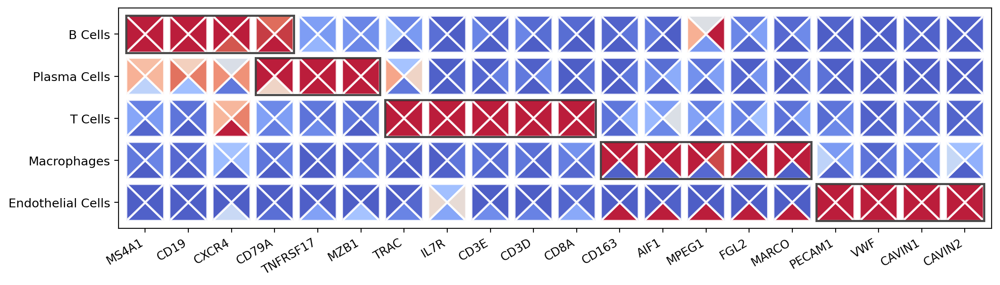

In [ ]:
def dt_to_numpy(arr):
    return arr.values if hasattr(arr, 'values') else arr
if hasattr(data1, 'values'): 
    x_axis_names = data1.columns
    y_axis_names = data1.index

save_fig = True 
data1, data2, data3, data4 = map(dt_to_numpy, [data1, data2, data3, data4])
data_up    = data1  # Glimmer (Bin)
data_down  = data2  # Baysor
data_left  = data3  # Cellpose
data_right = data4  # Xenium

# Plot
fig, ax = plt.subplots(figsize=(12, 3.5))
m, n = data_up.shape
norms = [Normalize(vmin=0, vmax=1) for _ in range(4)]
cmaps = [plt.cm.coolwarm] * 4
cell_size = 1.0
padding = 0.12
highlight_triangles = False
highlight_rectangles = True
for i in range(m):
    for j in range(n):
        y_plot = m - 1 - i
        x = j + padding/2
        y = y_plot + padding/2
        size = cell_size - padding
        top_left = [x, y + size]
        top_right = [x + size, y + size]
        bottom_left = [x, y]
        bottom_right = [x + size, y]
        center = [x + size/2, y + size/2]
        triangles = [
            Polygon([top_left, top_right, center], closed=True),
            Polygon([bottom_left, bottom_right, center], closed=True),
            Polygon([top_left, bottom_left, center], closed=True),
            Polygon([top_right, bottom_right, center], closed=True)
        ]
        data_sources = [data_up, data_down, data_left, data_right]
        for k, tri in enumerate(triangles):
            tri.set_facecolor(cmaps[k](norms[k](data_sources[k][i,j])))
            tri.set_edgecolor('white')
            tri.set_alpha(0.9) 
            tri.set_linewidth(1.8)
            ax.add_patch(tri)
            
if highlight_triangles:
    highlight_positions = [(0, 1), (2, 3), (3, 0)]
    for i in range(m):
        for j in range(n):
            y_plot = m - 1 - i
            x = j + padding/2
            y = y_plot + padding/2
            size = cell_size - padding
            top_left = [x, y + size]
            top_right = [x + size, y + size]
            center = [x + size/2, y + size/2]
            if (i, j) in highlight_positions:
                border_tri = Polygon(
                    [top_left, top_right, center], 
                    closed=True, fill=False, edgecolor='black', linewidth=2.5, alpha=0.8) 
                ax.add_patch(border_tri)

if highlight_rectangles:
    rectangles = [
        {'pos': (0, 0), 'width': 4, 'height': 1},
        {'pos': (1, 3), 'width': 3, 'height': 1},
        {'pos': (2, 6), 'width': 5, 'height': 1},
        {'pos': (3, 11), 'width': 5, 'height': 1},
        {'pos': (4, 16), 'width': 4, 'height': 1}
    ]
    for rect in rectangles:
        start_row, start_col = rect['pos']
        width = rect['width']
        height = rect['height']
        x = start_col * cell_size + padding/2
        y = (m - start_row - height) * cell_size + padding/2
        rect_width = width * cell_size - padding
        rect_height = height * cell_size - padding
        rectangle = Rectangle(
            (x, y), width=rect_width, height=rect_height, linewidth=1.8, edgecolor='black',
            facecolor='none', alpha=0.7, linestyle='-')
        ax.add_patch(rectangle)

ax.set_xlim(-padding, n+padding)
ax.set_ylim(-padding, m+padding)
ax.set_xticks(np.arange(n) + 0.5)
ax.set_yticks(np.arange(m) + 0.5)
ax.set_xticklabels(x_axis_names, rotation=30, ha='right', fontsize=10)
ax.set_yticklabels(y_axis_names[::-1], fontsize=10.5) 
ax.grid(False)
plt.tight_layout()
if save_fig:
    fig_name = fig_path + 'figure4/fig4_m_marker_genes_all_methods_heatmap.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.show() 

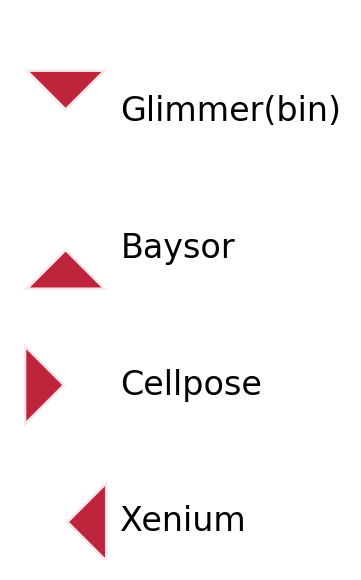

In [13]:
fig_legend = plt.figure(figsize=(3, 3))
ax_legend = fig_legend.add_subplot(111)
cell_size = 1.2    
padding = 0.1 
effective_size = cell_size - padding
legend_info = [
    {'label': 'Glimmer(bin)', 'cmap_idx': 0, 'tri_type': 0},  
    {'label': 'Baysor', 'cmap_idx': 1, 'tri_type': 1}, 
    {'label': 'Cellpose', 'cmap_idx': 2, 'tri_type': 2},  
    {'label': 'Xenium', 'cmap_idx': 3, 'tri_type': 3}  
]
n_items = len(legend_info)
item_spacing = cell_size * 1.5  
start_y = (n_items-1) * item_spacing  
for i, info in enumerate(legend_info):
    x_center = cell_size / 2
    y_center = start_y - i * item_spacing
    x = x_center - effective_size/2
    y = y_center - effective_size/2
    top_left = [x, y + effective_size]
    top_right = [x + effective_size, y + effective_size]
    bottom_left = [x, y]
    bottom_right = [x + effective_size, y]
    center = [x + effective_size/2, y + effective_size/2]
    if info['tri_type'] == 0:  
        vertices = [top_left, top_right, center]
    elif info['tri_type'] == 1: 
        vertices = [bottom_left, bottom_right, center]
    elif info['tri_type'] == 2:  
        vertices = [top_left, bottom_left, center]
    else: 
        vertices = [top_right, bottom_right, center]
    tri = Polygon(vertices, facecolor=cmaps[info['cmap_idx']](0.99), edgecolor='white', alpha=0.9,linewidth=1.8)
    ax_legend.add_patch(tri)
    ax_legend.text(x_center + cell_size*0.6, y_center, info['label'], va='center', ha='left', fontsize=12)
ax_legend.set_xlim(0, cell_size * 2.2)
ax_legend.set_ylim(-0.5, start_y + cell_size)
ax_legend.set_aspect('equal')
ax_legend.axis('off')
plt.tight_layout()
if save_fig:
    fig_name = fig_path + 'figure4/fig4_m_marker_genes_all_methods_heatmap_legend.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.show()

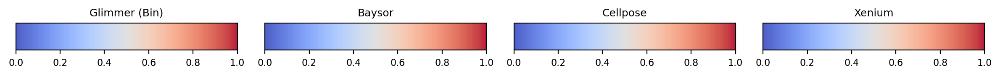

In [14]:
sources_labels = ['Glimmer (Bin)', 'Baysor', 'Cellpose', 'Xenium']
fig, cbar_axes = plt.subplots(1, 4, figsize=(12, 1))
for idx, ax_cbar in enumerate(cbar_axes):
    sm = ScalarMappable(norm=norms[idx], cmap=cmaps[idx])
    cbar = fig.colorbar(sm, cax=ax_cbar, orientation='horizontal', alpha=0.9)
    cbar.ax.tick_params(labelsize=8)
    ax_cbar.set_title(sources_labels[idx], fontsize=9, pad=6)
plt.tight_layout()
if save_fig:
    fig_name = fig_path + 'figure4/fig4_m_marker_genes_all_methods_heatmap_colorbars.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.show()

### 2.2 Subset samall patches from FOV (9-10) for plots

In [68]:
# merge pixel labels from cellpose, baysor, and Glimmer
integrated_res_path = f"{output_path}{fov_name}/integrated_clusters.csv"

if os.path.exists(integrated_res_path):
    print(f"Loading integrated_res")
    integrated_res = pd.read_csv(integrated_res_path, index_col=0)
else: 
    # 1.1 Glimmer (binned-level clustering)
    print("Loading Glimmer (binned-level clustering)")
    adata_path = f"{output_path}{fov_name}/Glimmer/adata.h5ad"
    pixle_df_path = f"{output_path}{fov_name}/Glimmer/transcripts_bins_mapping.csv"
    subset_adata = sc.read_h5ad(adata_path)
    pixle_df = pd.read_csv(pixle_df_path, index_col=0)
    bin_cluster_meta = pd.DataFrame(subset_adata.obs.index, columns=['bin'])
    bin_cluster_meta[bin_cluster] = subset_adata.obs[bin_cluster_key].values.astype(str)
    integrated_res = pixle_df.merge(bin_cluster_meta, left_on='bin', right_on='bin', how='left')
    
    # 1.2 Glimmer (cellular-level clustering)
    print("Loading Glimmer (cellular-level clustering)")
    output_col = "updated_cell_id_1"
    merged_col = "merged_cell_id_2"
    merged_df = integrated_res[integrated_res[bin_cluster].notna()].copy()
    merged_df[nucleus_label] = merged_df[nucleus_label].replace(0, pd.NA).astype('Int64')

    result_df = assign_cell_by_voronoi(
        merged_df, x=x, y=y, 
        nucleus_label=nucleus_label, 
        cluster_label=bin_cluster, 
        output_col=output_col, 
        n_workers=None, 
        max_distance=None, 
        dist_factor=3.0, 
        batch_size=1000, 
        verbose=True)
    
    result_df_filtered = merge_small_cells(
        result_df, x=x, y=y, 
        cluster=bin_cluster, 
        cell_id=output_col, 
        output=merged_col, 
        min_UMI=3, 
        filter=True, 
        k_neighbors=1, 
        verbose=True) 
    
    if output_col not in integrated_res.columns:
        integrated_res = integrated_res.merge(result_df[[x, y, 'bin', output_col]], on=[x, y, 'bin'], how='left')
    if merged_col not in integrated_res.columns:
        integrated_res = integrated_res.merge(result_df_filtered[[x, y, 'bin', merged_col]], on=[x, y, 'bin'], how='left')

    # 2. Cellpose (cellular-level clustering)
    print("Loading Cellpose (cellular-level clustering)")
    cellpose_res_path = f"{output_path}{fov_name}/Cellpose_cyto3_50"
    adata_path = f"{cellpose_res_path}/adata.h5ad"
    pixle_df_path = f"{cellpose_res_path}/cell_transcripts.csv"
    adata = sc.read_h5ad(adata_path)
    pixle_df = pd.read_csv(pixle_df_path)
    cellpose_cluster_meta = pd.DataFrame(adata.obs.index, columns=['cell_id'])
    cellpose_cluster_meta[cellpose_cluster] = adata.obs[cellpose_cluster_key].values.astype(str)
    pixle_df['cell_id'] = pixle_df['cell_id'].astype(str)
    cellpose_cluster_meta = pixle_df.merge(cellpose_cluster_meta, on='cell_id', how='left')
    cellpose_cluster_meta = cellpose_cluster_meta.rename(columns={'cell_id': 'cellpose_id', 'x_pixel': 'cellpose_x', 'y_pixel': 'cellpose_y'}) 
    cellpose_cluster_meta = cellpose_cluster_meta.drop(columns=['gene', 'Count'])
    integrated_res = integrated_res.merge(cellpose_cluster_meta, left_on=[x, y], right_on=['X', 'Y'], how='left')
    integrated_res = integrated_res.drop(columns=['X', 'Y'])

    # 3. Xenium (cellular-level clustering)
    print("Loading Xenium default (cellular-level clustering)")
    df_save_name = f"{output_path}{fov_name}/Xenium/cellular_leiden_clusters.csv"
    cellular_cluster_df = pd.read_csv(df_save_name, index_col=0)
    adata = adata_all[adata_all.obs_names.isin(cellular_cluster_df.index), :].copy()
    adata.obs[cellular_cluster_df.columns] = cellular_cluster_df.values.astype(str)
    xenium_cluster_meta = pd.DataFrame(adata.obs.index, columns=['cell_id'])
    xenium_cluster_meta[cell_cluster] = adata.obs[cell_cluster_key].values.astype(str)
    integrated_res = integrated_res.merge(xenium_cluster_meta, on='cell_id', how='left')

    # 4. Baysor (cellular-level clustering)
    print("Loading Baysor (cellular-level clustering)")
    baysor_results_path = f"{output_path}{fov_name}/Baysor/baysor_segfree_adata.csv"
    baysor_results = pd.read_csv(baysor_results_path)
    baysor_results = baysor_results[['X', 'Y', baysor_cluster_key, 'ncv_color']]
    baysor_results[baysor_cluster_key] = baysor_results[baysor_cluster_key].values.astype(str)
    integrated_res = integrated_res.merge(baysor_results, left_on=[x, y], right_on=['X', 'Y'], how='left')
    integrated_res = integrated_res.drop(columns=['X', 'Y'])

    # 5. FICTURE (hexagon-level clustering; convert to transcripts)
    print("Loading FICTURE (hexagon-level clustering)")
    
    from ficture.loaders.pixel_factor_loader import BlockIndexedLoader
    from sklearn.neighbors import NearestNeighbors

    def combine_loader_chunks(loader):
        chunks = [chunk for chunk in loader if not chunk.empty]
        return pd.concat(chunks, ignore_index=True) if chunks else pd.DataFrame()
    
    def assign_k_labels(original_df, approx_df, ficture_cluster):
        original_df = original_df.copy()
        original_coords = original_df[['x_location', 'y_location']].values
        approx_coords = approx_df[['X', 'Y']].values
        nn = NearestNeighbors(n_neighbors=1).fit(approx_coords)
        _, indices = nn.kneighbors(original_coords)
        closest_indices = indices.flatten()
        original_df[ficture_cluster] = approx_df.iloc[closest_indices]['K1'].values
        return original_df

    ficture_results_path = f"{output_path}{fov_name}/Ficture/analysis/nF{n_cluster}.d_12"
    ficture_file = f"{ficture_results_path}/nF{n_cluster}.d_12.decode.prj_12.r_4_5.pixel.sorted.tsv.gz"
    
    params = {
        'category_column': '',
        'full': True,
        'plot_um_per_pixel': 1,
        'org_coord': True,
        'plot_top': False,
        'xmin': -np.inf, 'xmax': np.inf,
        'ymin': -np.inf, 'ymax': np.inf,
        'input_file': ficture_file
    }
    loader = BlockIndexedLoader(
        params['input_file'],
        params['xmin'], params['xmax'],
        params['ymin'], params['ymax'],
        params['full'], not params['org_coord'],
        idtype={params['category_column']: str} if params['category_column'] else {}
    )

    # clean and save integrated_res
    integrated_res = integrated_res.dropna(subset=[bin_cluster, cell_cluster, baysor_cluster_key]).copy()
    for col in [bin_cluster, cell_cluster, cellpose_cluster, baysor_cluster_key]:
        if col in integrated_res.columns:
            integrated_res[col] = integrated_res[col].astype('Int64')
    integrated_res = assign_k_labels(integrated_res, combine_loader_chunks(loader), ficture_cluster)
    integrated_res.to_csv(integrated_res_path) 

Loading integrated_res


In [69]:
# Subset patches for visiualization 
center_x, center_y = 785, 4195
radius = 40
x = "x_location"
y = "y_location"

df = integrated_res.copy()
x_min, x_max = center_x - radius, center_x + radius
y_min, y_max = center_y - radius, center_y + radius
selected_df = df[(df[x] >= x_min) & (df[x] <= x_max) & (df[y] >= y_min) & (df[y] <= y_max)].copy()

In [ ]:
### Add Baysor segmentation results
# baysor preview \
#   -x x_location \
#   -y y_location \
#   -z z_location \
#   -g feature_name X0.0-24000.0_Y0.0-24000.0_filtered_transcripts.csv
# baysor run \
#   -x x_location \
#   -y y_location \
#   -z z_location \
#   -g feature_name \
#   -m 5 \
#   -p \
#   --prior-segmentation-confidence 0.5 \
#   X0.0-24000.0_Y0.0-24000.0_filtered_transcripts.csv :cell_id

In [70]:
baysor_cell_id_path = f"{dir_path}baysor/segmentation.csv"
baysor_segmentation = pd.read_csv(baysor_cell_id_path, low_memory=False)
baysor_segmentation['baysor_cell'] = baysor_segmentation['cell'].astype(str)
baysor_segmentation['baysor_cluster_all'] = baysor_segmentation['cluster'].astype(str)

add_cols = ['x', 'y', 'baysor_cell', 'baysor_cluster_all']
if all(col in selected_df.columns for col in add_cols):
    selected_df = selected_df.drop(columns=add_cols) 

selected_df = selected_df.merge(baysor_segmentation[add_cols], left_on=[x, y], right_on=['x', 'y'], how='left')
selected_df = selected_df.drop(columns=['x', 'y']) 

In [71]:
# Plot transcript distribution
def plot_transcript_distribution(
        df, color_column, title, s=7.5, outline='cell', cell_col="cell_id", 
        bin_size=2.02, pt_alpha=1, lw=1.1, blw=0.8, x="x_location", y="y_location", 
        add_circle=None, save_name=None
    ):
    
    from shapely.geometry import MultiPoint
    from matplotlib.patches import Polygon as mplPolygon, Circle

    def get_cluster_color(df, color_column):
        color_column_hex = color_column + "_color"
        if color_column_hex in df.columns:
            return df[color_column_hex], None
        else:
            return df[color_column].astype("category").cat.codes, plt.colormaps["Set1"]
    
    # Plot
    _, ax = plt.subplots(figsize=(6, 6))
    c, cmap = get_cluster_color(df, color_column)

    mask = c.notna()
    _ = ax.scatter(df[x][mask], df[y][mask], c=c[mask], cmap=cmap, s=s, edgecolor='none', alpha=pt_alpha, zorder=1)

    # Minimum Bounding Box (MBB)
    points = MultiPoint(list(zip(df[x], df[y])))
    hull = points.convex_hull
    min_x, min_y, max_x, max_y = hull.envelope.bounds
    
    if outline == 'cell':
        for _, group in df.groupby(cell_col):
            if len(group) > 2: 
                cell_points = MultiPoint(list(zip(group[x], group[y])))
                cell_hull = cell_points.convex_hull  
                if cell_hull.geom_type == 'Polygon':
                    if cell_hull.area <= 500:
                        patch = mplPolygon(list(cell_hull.exterior.coords), edgecolor='black', 
                                           facecolor='none', linewidth=lw, linestyle='dashed')
                        ax.add_patch(patch)

    elif outline == 'bin': 
        x_bins = np.linspace(min_x, max_x, num=int((max_x-min_x)/bin_size)+1)
        y_bins = np.linspace(min_y, max_y, num=int((max_y-min_y)/bin_size)+1)
        for x in x_bins:
            ax.plot([x, x], [min_y, max_y], color='black', linestyle='--', linewidth=blw, zorder=3, alpha=0.6)
        for y in y_bins:
            ax.plot([min_x, max_x], [y, y], color='black', linestyle='--', linewidth=blw, zorder=3, alpha=0.6)

    # Add circle (highlight cells)
    if add_circle is not None:
        for center, radius in add_circle:  
            circle = Circle(center, radius, edgecolor='#3366FF', facecolor='none', 
                            linewidth=2.5, linestyle='-', zorder=10, alpha=0.85) 
            ax.add_patch(circle)
    
    ax.set_xlim(min_x, max_x)
    ax.set_ylim(min_y, max_y)
    ax.axis('off')
    ax.set_title(title, fontsize=12)
    ax.axis("equal")

    # save figure
    if save_name is not None:
        fig_name = fig_path + f'figure4/{save_name}'
        plt.savefig(fig_name, format="svg", bbox_inches="tight")
    plt.show() 


# Scale point size by density of transcripts
def compute_density_point_size(df, feature_col_name, genes_of_interest, s_min=3, s_max=50, k=6):
    df = df.copy()
    df.loc[:, feature_col_name] = df['feature_name'].apply(lambda x: 0 if x in genes_of_interest else 1)
    df = df.sort_values(by=feature_col_name, ascending=False)
    red_df = df[df[feature_col_name] == 0].copy()
    red_coords = red_df[["x_location", "y_location"]].values

    if len(red_coords) >= k:
        nbrs = NearestNeighbors(n_neighbors=k).fit(red_coords)
        distances, _ = nbrs.kneighbors(red_coords)
        density_score = 1 / (distances[:, 1:].mean(axis=1) + 1e-3)
        density_scaled = (density_score - density_score.min()) / (density_score.max() - density_score.min())
        point_sizes = np.full(len(df), s_min)
        point_sizes[df[feature_col_name] == 0] = s_min + density_scaled * (s_max - s_min)
    else:
        point_sizes = np.full(len(df), s_min)

    return df, point_sizes

In [72]:
# Detect abnormal cells for Glimmer results
merged_col = "merged_cell_id_2"
abnormal_df = abnormal_cell_detection(
    selected_df, 
    cell_col=merged_col, 
    x=x, 
    y=y, 
    polarity_thresh=0.95, 
    umi_quantile=0.15, 
    density_thresh=0.95
)
if 'abnormal' in selected_df.columns:
    selected_df = selected_df.drop(columns=['abnormal'])
selected_df = selected_df.merge(abnormal_df[[merged_col, 'abnormal']], on=merged_col, how='left')
selected_df['abnormal'] = selected_df['abnormal'].fillna(0).astype(int)

In [73]:
# Assign colors to clusters
# '#d73027',  # red
# '#66bd63',  # green
# '#fdae61',  # orange
# '#a6611a',  # brown
# '#969696'   # gray 
cluster_color_mapping = {
    'bin_cluster': {
        0: '#d73027',  
        1: '#fdae61',  
        2: '#66bd63',  
        3: '#a6611a',  
        4: '#969696'   
    },
    'cell_cluster': {
        0: '#a6611a',
        1: '#66bd63',
        2: '#fdae61',
        3: '#d73027',
        4: '#969696'
    },
    'cellpose_cluster': {
        1: '#a6611a',
        0: '#66bd63',
        2: '#fdae61',
        4: '#d73027',
        3: '#969696'
    },
    'baysor_cluster': {
        0: '#969696', 
        1: '#fdae61', 
        2: '#66bd63', 
        3: '#a6611a', 
        4: '#d73027' 
    },
    'ficture_cluster': {
        0: '#969696', 
        1: '#fdae61', 
        2: '#66bd63', 
        3: '#a6611a', 
        4: '#d73027' 
    }
}
selected_df[f'{bin_cluster}_color'] = selected_df[bin_cluster].map(cluster_color_mapping['bin_cluster'])
selected_df[f'{cell_cluster}_color'] = selected_df[cell_cluster].map(cluster_color_mapping['cell_cluster'])
selected_df[f'{cellpose_cluster}_color'] = selected_df[cellpose_cluster].map(cluster_color_mapping['cellpose_cluster'])
selected_df[f'{baysor_cluster_key}_color'] = selected_df[baysor_cluster_key].map(cluster_color_mapping['baysor_cluster'])
selected_df[f'{ficture_cluster}_color'] = selected_df[baysor_cluster_key].map(cluster_color_mapping['ficture_cluster'])

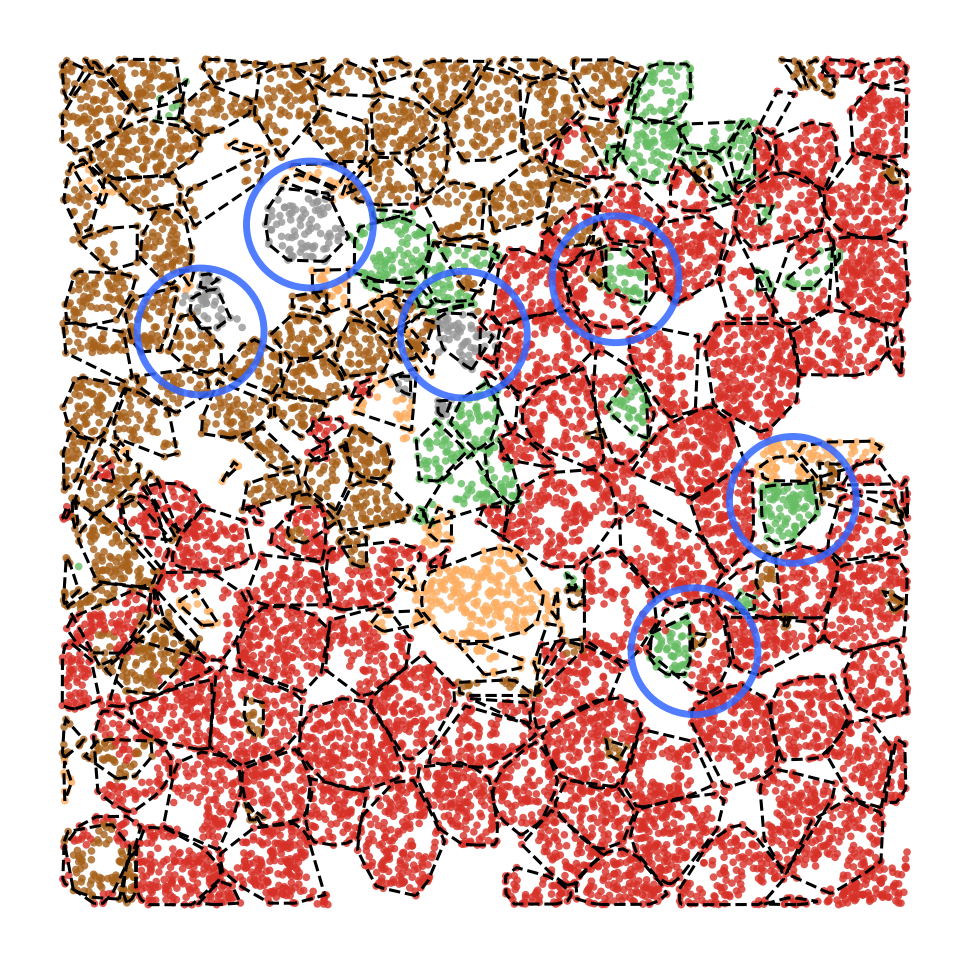

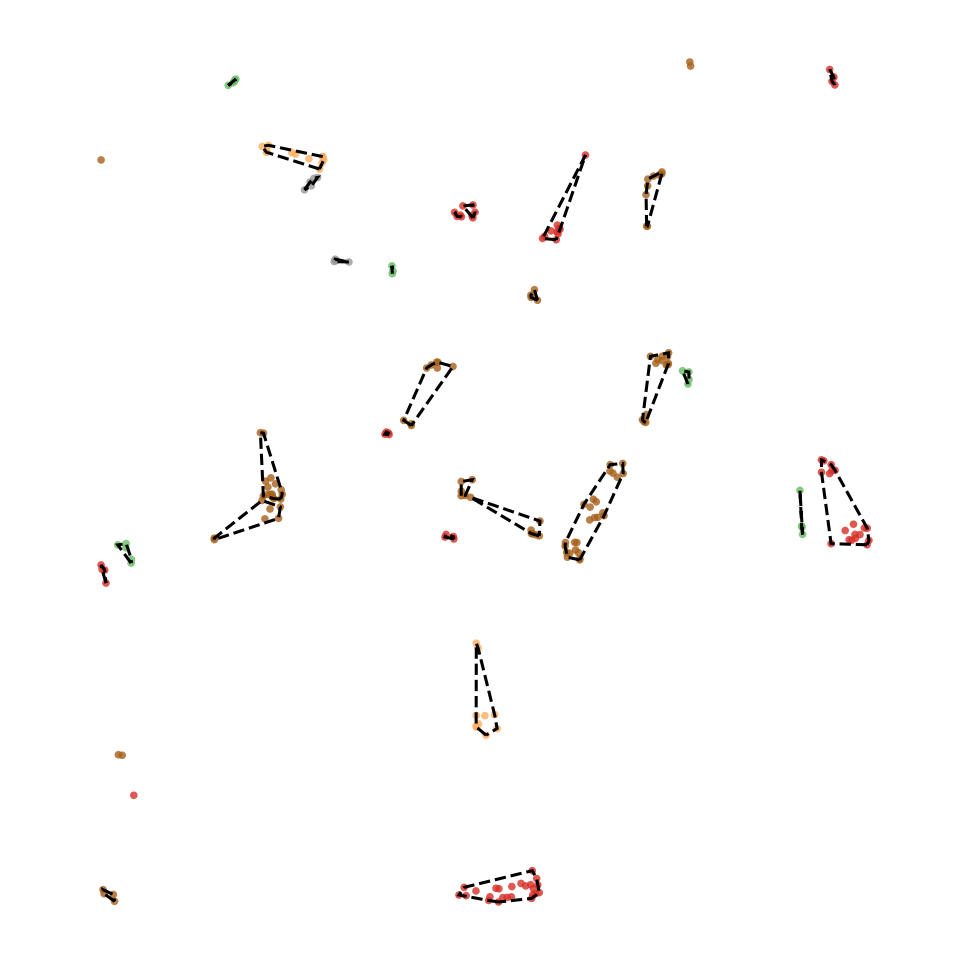

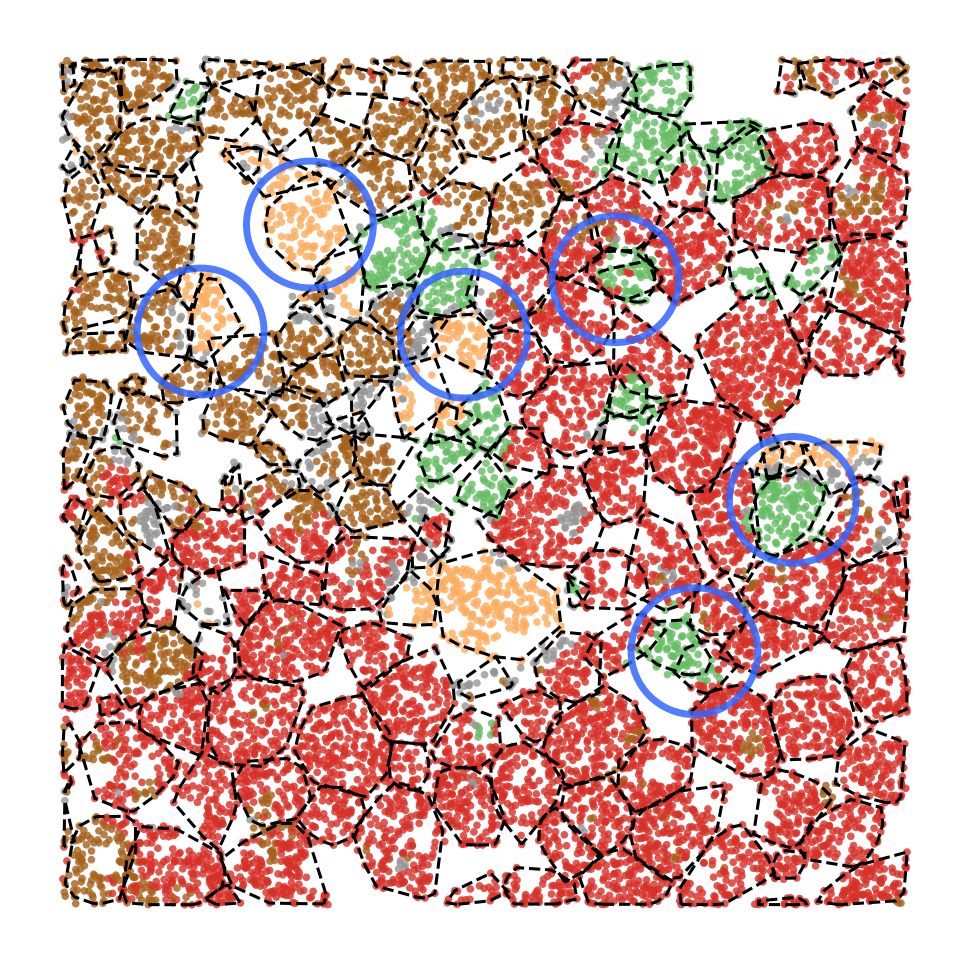

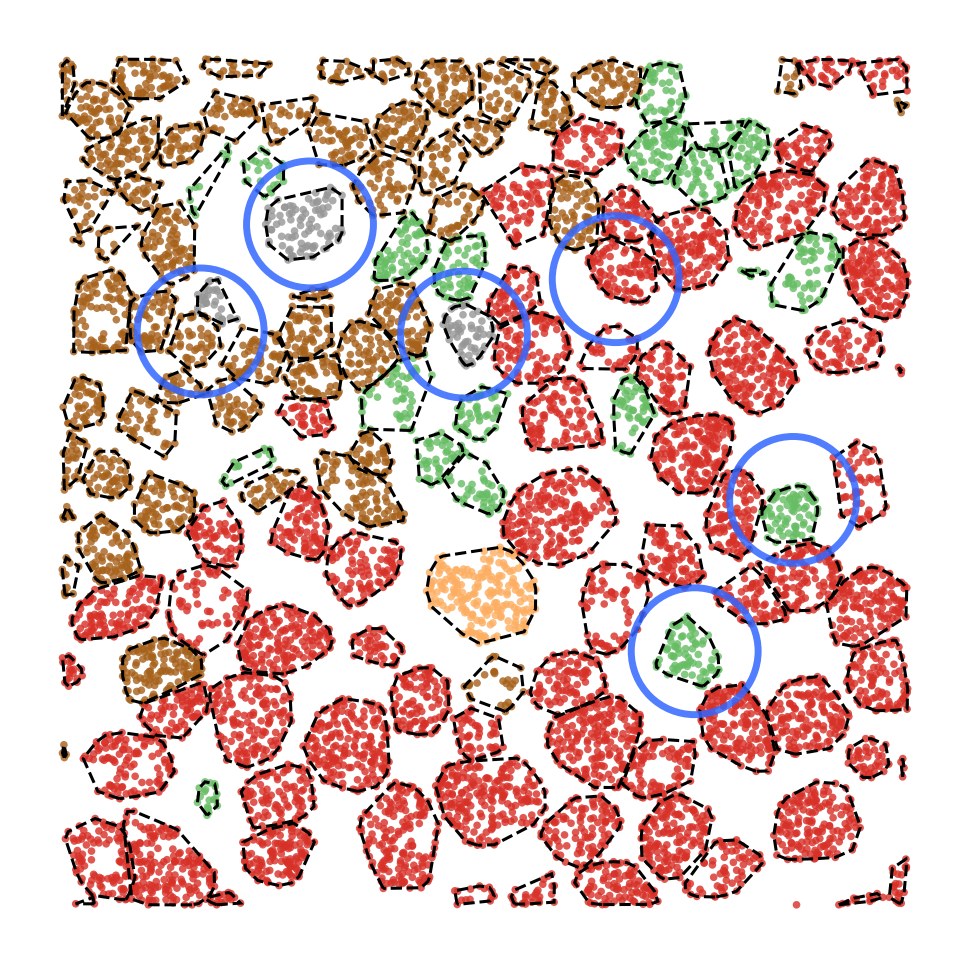

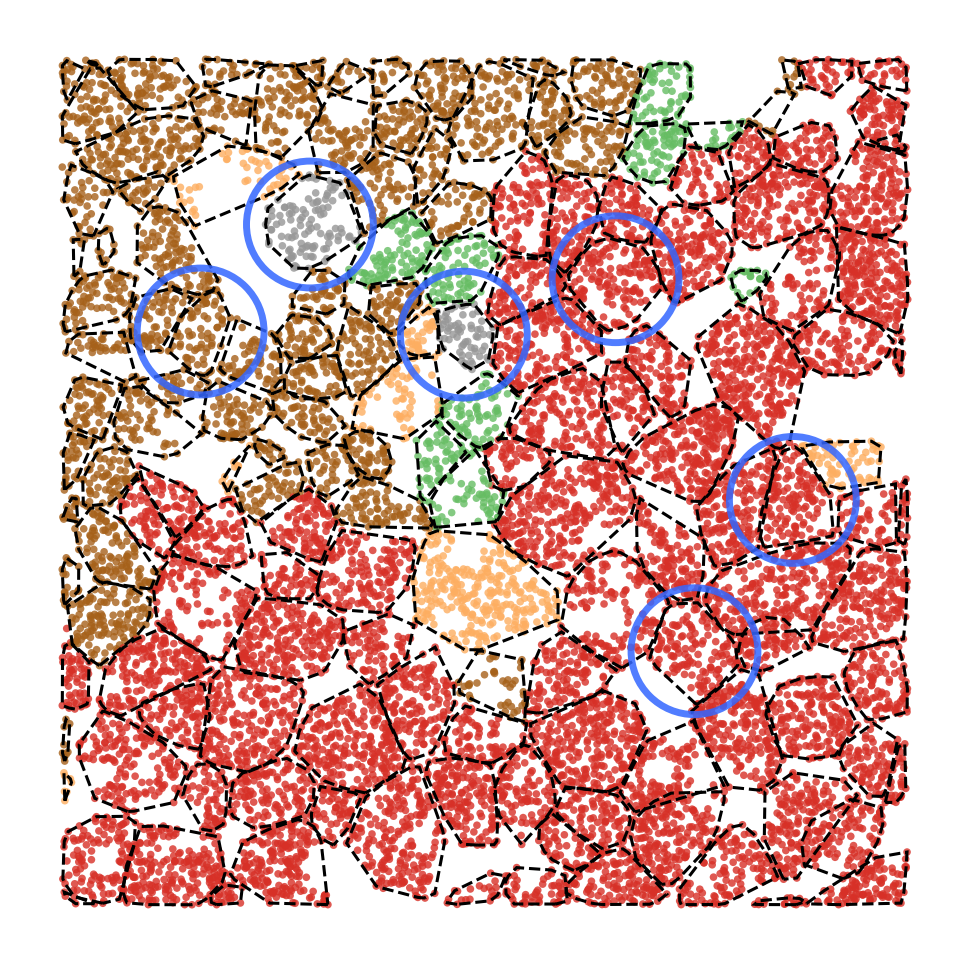

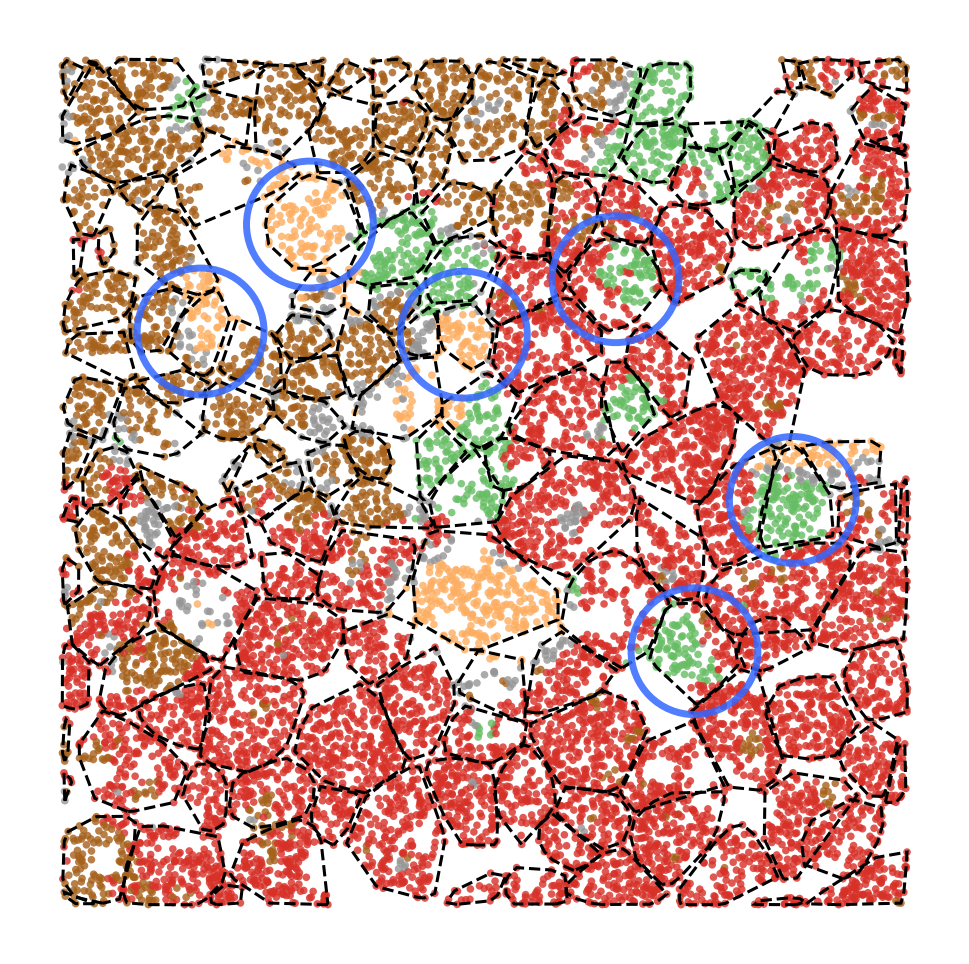

In [75]:
# Select cell IDs mis-assigned by Cellpose (T cells & Epithelial cells)
tcell_id_list = ['aiiphlfo-1', 'fmednhmm-1', 'fmedelkg-1']
endothelial_id_list = ['aiiekenj-1', 'fmgpbcol-1', 'fmgnjeko-1']

cell_id_list = tcell_id_list + endothelial_id_list
circle_list = [((group['x_location'].mean(), group['y_location'].mean()), 6) 
for cell_id in cell_id_list 
if not (group := selected_df[selected_df['cell_id'] == cell_id]).empty]

save_name_1 = "fig4_m_patch_1_Glimmer_outlined_Segmentated_cells.svg"
save_name_2 = "fig4_s_patch_1_Glimmer_outlined_Abnormal_cells.svg"
save_name_3 = "fig4_m_patch_2_baysor_outlined_baysor_cells.svg"
save_name_4 = "fig4_m_patch_3_cellpose_outlined_cellpose_cells.svg"
save_name_5 = "fig4_m_patch_4_xenium_outlined_xenium_cells.svg"
save_name_6 = "fig4_m_patch_5_Ficture_outlined_xenium_cells.svg"

# Glimmer (Segmentated cells) 
plot_transcript_distribution(
    selected_df[selected_df['abnormal'] == 0], color_column=bin_cluster, 
    title="", outline='cell', pt_alpha=0.8, cell_col=merged_col,
    add_circle=circle_list, save_name=save_name_1)

# Glimmer (Abnormal Cells)
plot_transcript_distribution(
    selected_df[selected_df['abnormal'] == 1], color_column=bin_cluster, 
    title="", outline='cell', pt_alpha=0.8,
    cell_col=merged_col, save_name=save_name_2)

# Baysor Clusters 
plot_transcript_distribution(
    selected_df, color_column=baysor_cluster_key, 
    title="", outline='cell', pt_alpha=0.8, cell_col='baysor_cell',
    add_circle=circle_list, save_name=save_name_3)

# Cellpose3 Clusters
plot_transcript_distribution(
    selected_df, color_column=cellpose_cluster, 
    title="", outline='cell', pt_alpha=0.8, cell_col='cellpose_id',
    add_circle=circle_list, save_name=save_name_4)

# Xenium Clusters
plot_transcript_distribution(
    selected_df, color_column=cell_cluster, 
    title="", outline='cell', pt_alpha=0.8, cell_col='cell_id',
    add_circle=circle_list, save_name=save_name_5)

# FICTURE Clusters
plot_transcript_distribution(
    selected_df, color_column=ficture_cluster, 
    title="", outline='cell', pt_alpha=0.8, cell_col='cell_id',
    add_circle=circle_list, save_name=save_name_6)

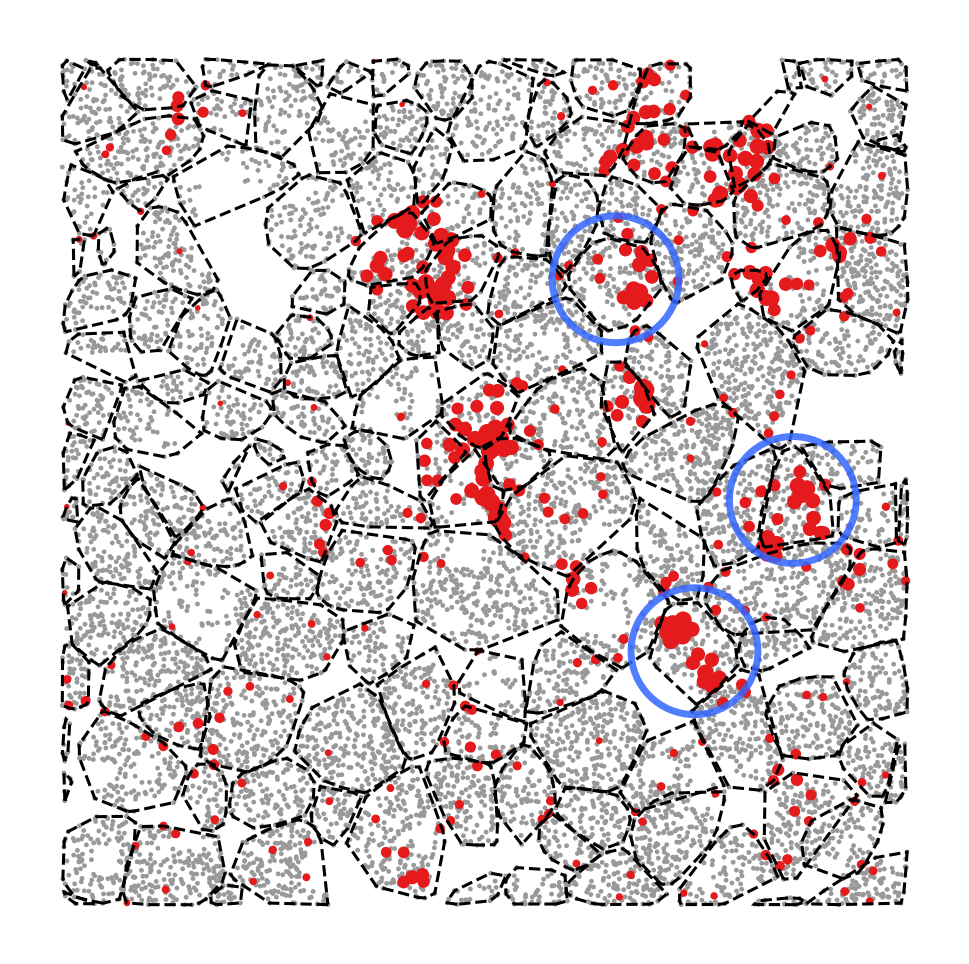

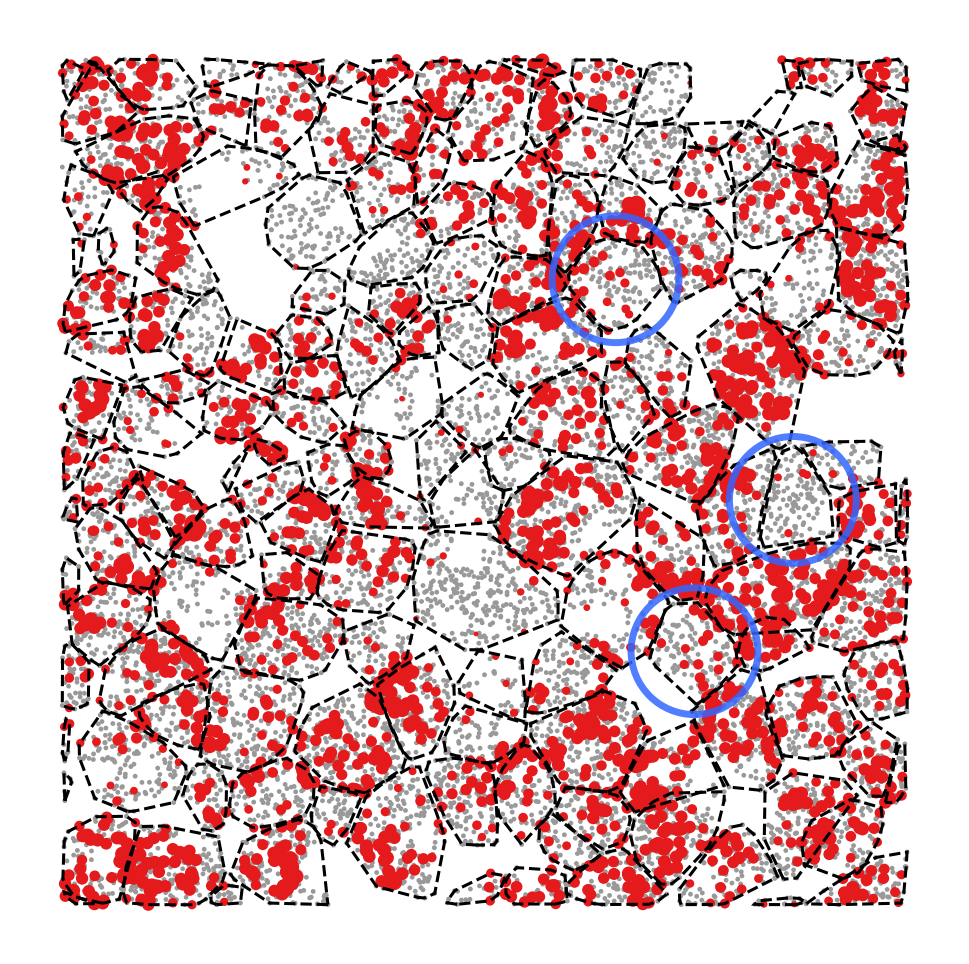

In [76]:
# T cell list
circle_list = [((group['x_location'].mean(), group['y_location'].mean()), 6) 
               for cell_id in tcell_id_list 
               if not (group := selected_df[selected_df['cell_id'] == cell_id]).empty]

# T cell
tcell_genes = {'CD3E', 'CD3D', 'TRAC'}
tcell_col = 'tcell_feature'
save_name_t = "fig4_m_patch_6_Genes_TCell_xenium_outlined.svg"
selected_df_t, t_point_sizes = compute_density_point_size(selected_df, tcell_col, tcell_genes)
# CD3E|CD3D|TRAC Transcripts
plot_transcript_distribution(selected_df_t, tcell_col, "", s=t_point_sizes, 
                             outline='cell', add_circle=circle_list, save_name=save_name_t)

# B cell 
bcell_genes = {'MS4A1', 'CD19', 'CD79A'}
bcell_col = 'bcell_feature'
save_name_b = "fig4_s_patch_2_Genes_BCell_xenium_outlined.svg"
selected_df_b, b_point_sizes = compute_density_point_size(selected_df, bcell_col, bcell_genes)
# MS4A1|CD19|CD79A Transcripts
plot_transcript_distribution(selected_df_b, bcell_col, "", s=b_point_sizes, 
                             outline='cell', add_circle=circle_list, save_name=save_name_b)

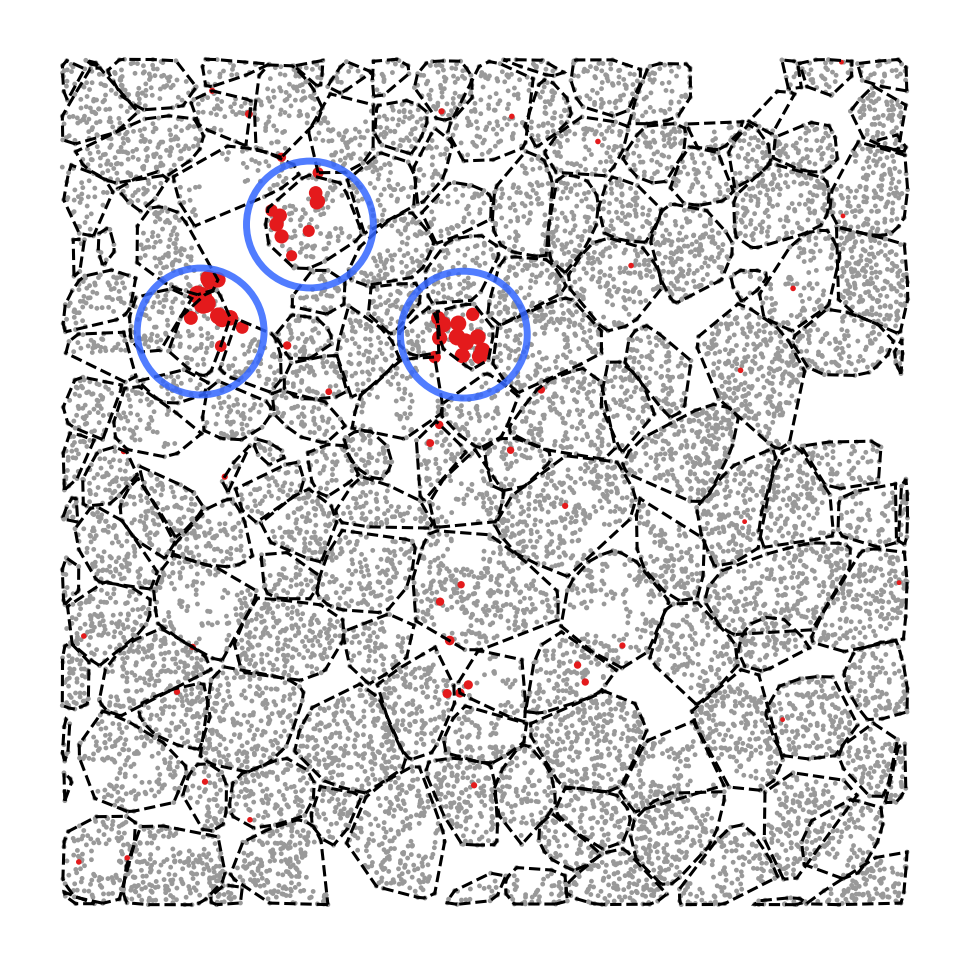

In [77]:
# Endothelial cell list 
circle_list = [((group['x_location'].mean(), group['y_location'].mean()), 6) 
               for cell_id in endothelial_id_list 
               if not (group := selected_df[selected_df['cell_id'] == cell_id]).empty]

# Endothelial cell
endothelial_genes = {'PECAM1', 'VWF', 'CAVIN1', 'CAVIN2'}
endothelial_col = 'endothelial_feature'
save_name_e ="fig4_m_patch_7_Genes_Endothelial_xenium_outlined.svg"
# PECAM1|VWF|CAVIN1|CAVIN2 Transcripts
selected_df_e, e_point_sizes = compute_density_point_size(selected_df, endothelial_col, endothelial_genes)
plot_transcript_distribution(selected_df_e, endothelial_col, "", s=e_point_sizes, 
                             outline='cell', add_circle=circle_list, save_name=save_name_e) 

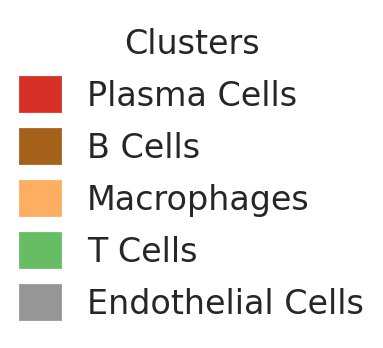

In [78]:
def plot_cluster_legend(df, color_column, save_name, cluster_name_map=None):
    import matplotlib.patches as mpatches

    unique_clusters = df[color_column].unique()
    if cluster_name_map is not None:
        label_names = [cluster_name_map.get(label, str(label)) for label in unique_clusters]
    else:
        label_names = [str(label) for label in unique_clusters]
    legend_patches = [
        mpatches.Patch(color=color, label=name)
        for color, name in zip(unique_clusters, label_names)
    ]
    fig, ax = plt.subplots(figsize=(2, 2))
    ax.axis("off")
    ax.legend(
        handles=legend_patches, title="Clusters", loc="center", fontsize=12, frameon=False,
        bbox_to_anchor=(0.5, 0.5), borderaxespad=0, borderpad=0, handleheight=1.2, handlelength=1.2
    )
    fig_name = os.path.join(fig_path, f'figure4/{save_name}')
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
    plt.show()

# Legend for Binned Clusters (Also used for Cellpose & Baysor Clusters)
cluster_names = {v: f"Bin cluster {k}" for k, v in cluster_color_mapping['bin_cluster'].items()}
cluster_names = {
    '#d73027': "Plasma Cells", # 0
    '#fdae61': "Macrophages", # 1
    '#66bd63': "T Cells", # 2
    '#a6611a': "B Cells", # 3
    '#969696': "Endothelial Cells" # 4
}
fig_name = "fig4_m_patch_cluster_legend_Glimmer_cellpose_baysor.svg"
plot_cluster_legend(selected_df, "binned_cluster_color", fig_name, cluster_name_map=cluster_names)

### 2.3 Plot spatial distribution of transcripts colored by genes

In [79]:
# add bin center
bin_size = 2.02 

# selected region for illustration
x_start = 785
x_end = 805
y_start = 4195
y_end = 4215
highlight_idx = 30

# subset selected region
selected_df_patch = selected_df[
    (selected_df[x] >= x_start) & (selected_df[x] < x_end) &
    (selected_df[y] >= y_start) & (selected_df[y] < y_end)
].copy() 

In [81]:
### Subset one bin & Plot detailed illustration (Color by subset genes)
# Compute bin centers
bin_centers = selected_df_patch.groupby('bin')[[x, y]].mean().reset_index()
bin_centers.columns = ['bin', 'x', 'y']

# Select a bin as highlight
highlight_idx = 30
highlight_bin = bin_centers.iloc[highlight_idx]
highlight_x, highlight_y = highlight_bin[['x', 'y']]

# >>> Snap to nearest grid center <<<
highlight_x = round(highlight_x / bin_size) * bin_size
highlight_y = round(highlight_y / bin_size) * bin_size

# Find neighbors
k = 15
nn = NearestNeighbors(n_neighbors=k).fit(bin_centers[['x', 'y']])
neighbors = nn.kneighbors(return_distance=False)
highlight_neighbors = neighbors[highlight_idx]
neighbor_coords = bin_centers.iloc[highlight_neighbors][['x', 'y']].values

# Snap neighbor coords to nearest grid
neighbor_coords = np.array([
    [round(x / bin_size) * bin_size, round(y / bin_size) * bin_size]
    for x, y in neighbor_coords
])

# Select top N genes & Encode color
n_genes = 10
feature_col = 'feature_name'
top_genes = selected_df_patch[feature_col].value_counts().head(n_genes).index
selected_df_patch_colored = selected_df_patch[selected_df_patch[feature_col].isin(top_genes)].copy()
selected_df_patch_gray = selected_df_patch[~selected_df_patch[feature_col].isin(top_genes)].copy()
le = LabelEncoder()
selected_df_patch_colored['feature_code'] = le.fit_transform(selected_df_patch_colored[feature_col])

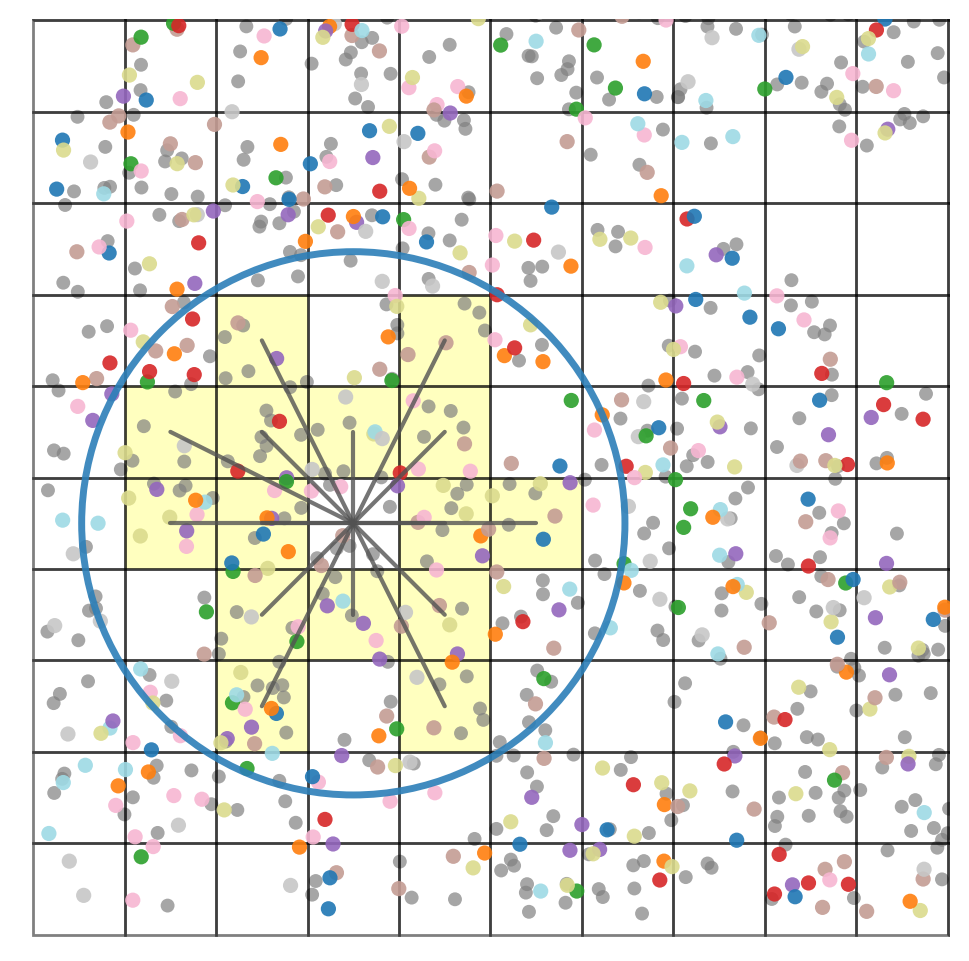

In [82]:
# Plot
fig, ax = plt.subplots(figsize=(6, 6))

# Plot other genes (gray) & colored top N genes
s=25
ax.scatter(selected_df_patch_gray[x], selected_df_patch_gray[y], s=s, 
           c='gray', edgecolor='none', alpha=0.7, zorder=1)
sc = ax.scatter(selected_df_patch_colored[x], selected_df_patch_colored[y], s=s+5, 
                c=selected_df_patch_colored["feature_code"], 
                cmap='tab20', edgecolor='none', alpha=0.9, zorder=2)

# Plot grid & Align the center with highlight bin
x_min, x_max = selected_df_patch[x].min(), selected_df_patch[x].max()
y_min, y_max = selected_df_patch[y].min(), selected_df_patch[y].max()
highlight_x_idx = int(np.floor(highlight_x / bin_size))
highlight_y_idx = int(np.floor(highlight_y / bin_size))
n_bins_x = int((x_max - x_min) / bin_size) + 5
n_bins_y = int((y_max - y_min) / bin_size) + 5
x_idx_range = np.arange(highlight_x_idx - n_bins_x, highlight_x_idx + n_bins_x + 1)
y_idx_range = np.arange(highlight_y_idx - n_bins_y, highlight_y_idx + n_bins_y + 1)

# Grid
for xi in x_idx_range:
    for yi in y_idx_range:
        x_center = xi * bin_size
        y_center = yi * bin_size
        x0 = x_center - bin_size / 2
        y0 = y_center - bin_size / 2
        if (x0 >= x_min - bin_size and x0 <= x_max + bin_size and
            y0 >= y_min - bin_size and y0 <= y_max + bin_size):
            rect = Rectangle((x0, y0), bin_size, bin_size,
                             facecolor='none', edgecolor='black',
                             linestyle='-', linewidth=1, alpha=0.5, zorder=1)
            ax.add_patch(rect)

# Selected bin & neighbors
ax.add_patch(Circle((highlight_x, highlight_y), 6, fill=False, edgecolor='#2c7fb8', 
                    linewidth=2.5, zorder=10, alpha=0.9))
for nx, ny in neighbor_coords:
    ax.plot([highlight_x, nx], [highlight_y, ny], color='#525252', linewidth=1.5, zorder=10, alpha=0.8)

# Highlight neighbor bins by yellow background
for nx, ny in neighbor_coords:
    rect = Rectangle((nx - bin_size / 2, ny - bin_size / 2), bin_size, bin_size,
                     facecolor='yellow', edgecolor='none', alpha=0.25, zorder=0.5)
    ax.add_patch(rect)
ax.set_xlim(x_min - 0.30*bin_size, x_max + 0.01*bin_size)
ax.set_ylim(y_min - 0.30*bin_size, y_max - 0.10*bin_size)
ax.set_title("")
ax.set_aspect('equal')
ax.axis('off')
save_name = fig_path + 'figure4/fig4_m_patch_subset_Glimmer_illustration_2_neighbor_bins.svg'
ax.figure.savefig(save_name, format="svg", bbox_inches="tight")
plt.show()

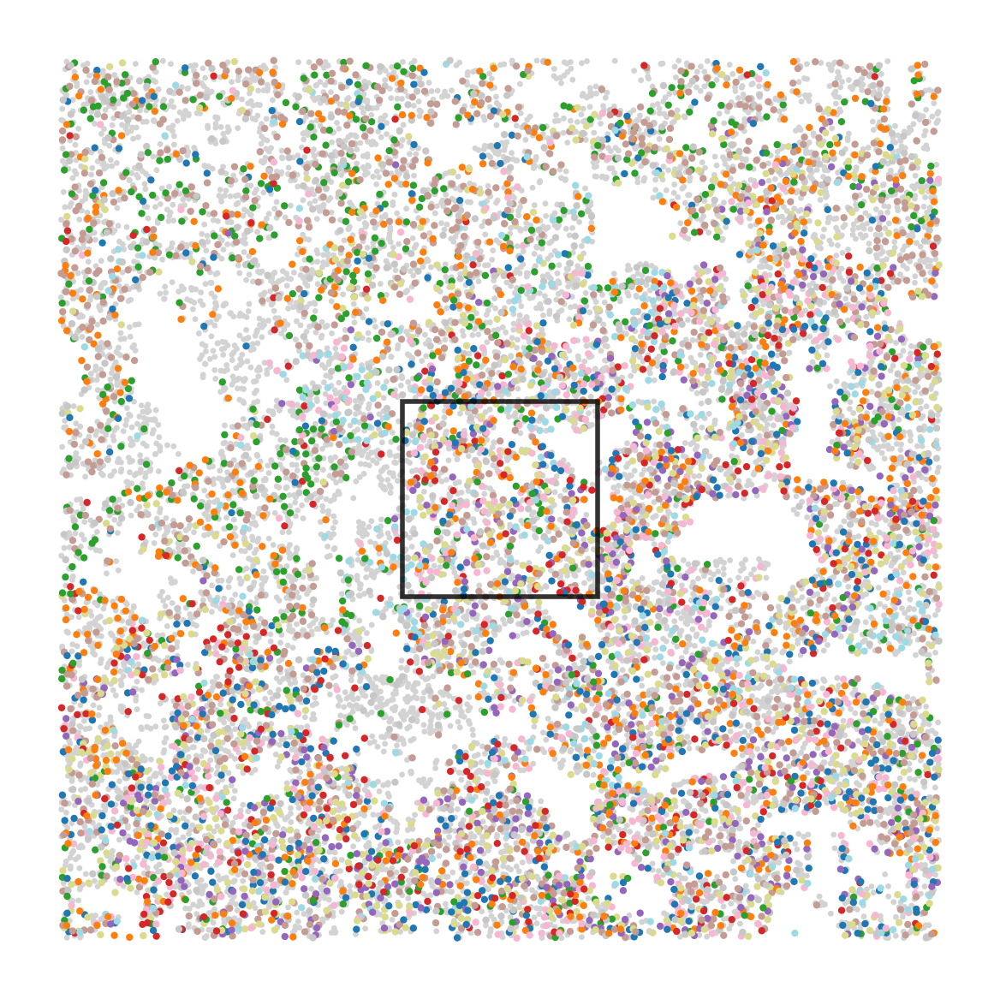

In [83]:
# # Subset larger region for illustration
x_start = 785
x_end = 805
y_start = 4195
y_end = 4215

# For large region
radius = 45

# Subset selected region
df = integrated_res.copy()
center_x, center_y = (x_start + x_end) / 2, (y_start + y_end) / 2
df = df[(df[x] >= center_x - radius) & (df[x] <= center_x + radius) & (df[y] >= center_y - radius) & (df[y] <= center_y + radius)].copy()
df_colored = df[df[feature_col].isin(top_genes)].copy()
df_gray = df[~df[feature_col].isin(top_genes)].copy()
df_colored['feature_code'] = le.fit_transform(df_colored[feature_col])

# Plot
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(df_gray[x], df_gray[y], color='lightgray', s=6, edgecolor='none', label='Other genes')
scp = ax.scatter(df_colored[x], df_colored[y], c=df_colored['feature_code'], cmap='tab20', s=9, edgecolor='none')
# Subset patch to highlight
rect = plt.Rectangle((x_start, y_start), (x_end - x_start), (y_end - y_start), linewidth=2, edgecolor='black', facecolor='none', alpha=0.8)
ax.add_patch(rect)
ax.set_aspect('equal')
ax.axis('off')
ax.set_title("")
plt.tight_layout()
save_name = fig_path + 'figure4/fig4_m_patch_subset_Glimmer_illustration_1_transcripts.svg'
plt.savefig(save_name, format="svg", bbox_inches="tight")
plt.show()

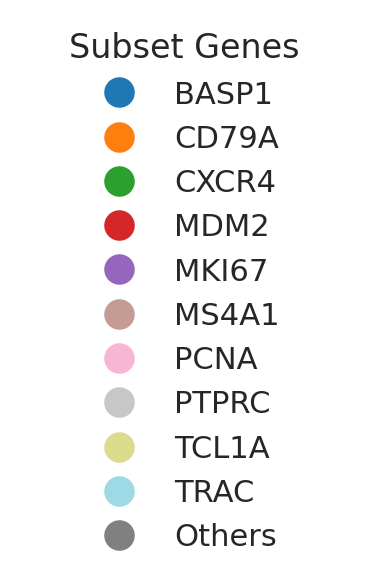

In [84]:
handles, _ = scp.legend_elements(prop="colors", num=n_genes)
colors = [handle.get_color() for handle in handles]
legend_labels = le.classes_.tolist()

# add other genes
legend_labels.append("Others")
colors.append("gray")
legend_circles = [
    Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=12)
    for label, color in zip(legend_labels, colors)
]

# plot legend
fig, ax = plt.subplots(figsize=(2, len(legend_circles) * 0.2))
ax.legend(handles=legend_circles, title="Subset Genes", loc='center', frameon=False)
ax.axis('off')
plt.tight_layout()
fig_name = fig_path + 'figure4/fig4_m_patch_subset_Glimmer_illustration_1_transcripts_legend.svg'
plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.show()

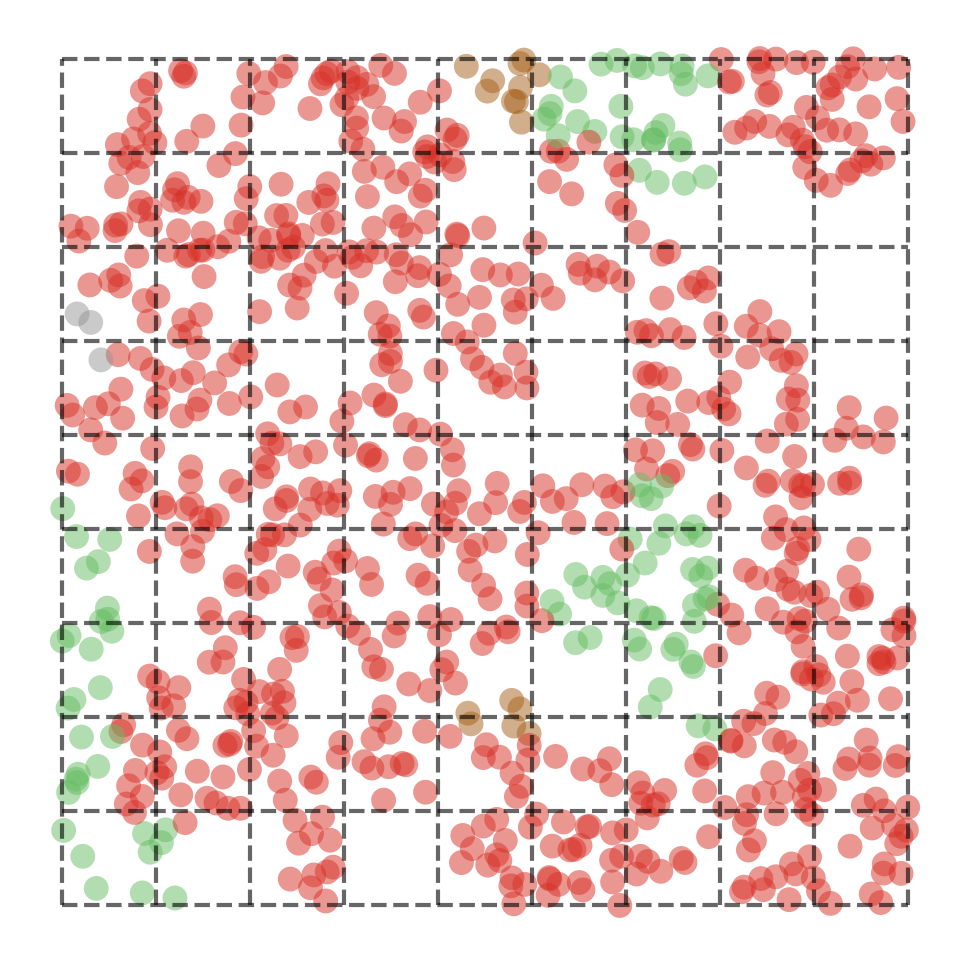

In [85]:
# Bin-based annotation
plot_transcript_distribution(
    selected_df_patch[selected_df_patch['abnormal'] == 0], 
    color_column=bin_cluster, 
    title="", 
    outline='bin', 
    cell_col=merged_col,
    add_circle=None,
    s=80,
    lw=1.8,
    blw=1.5,
    pt_alpha=0.5,
    save_name="fig4_m_patch_subset_Glimmer_illustration_3_cluster_bins.svg"
)

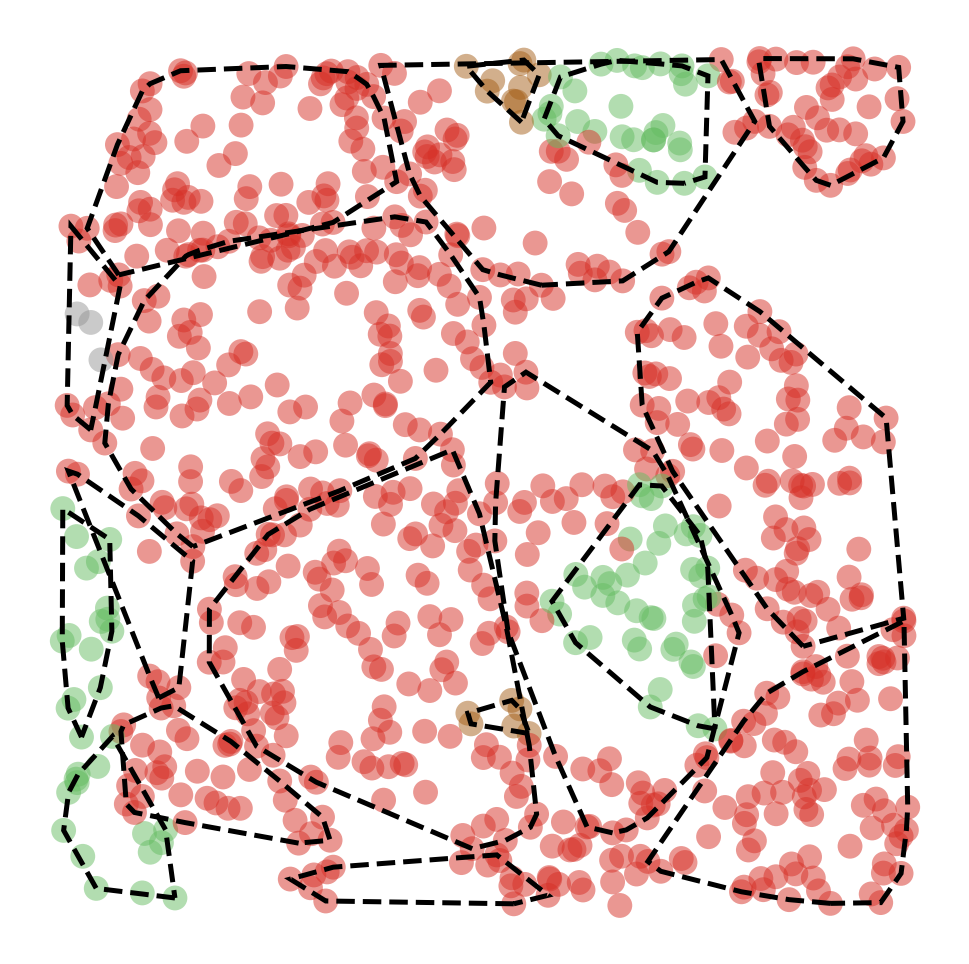

In [86]:
# Segmentation-based annotation
plot_transcript_distribution(
    selected_df_patch[selected_df_patch['abnormal'] == 0], 
    color_column=bin_cluster, 
    title="", 
    outline='cell', 
    cell_col=merged_col,
    add_circle=None,
    s=80,
    lw=1.8,
    pt_alpha=0.5,
    save_name="fig4_m_patch_subset_Glimmer_illustration_4_segmentation.svg"
)